(section:optics-DBSCAN)=
# Clustering using DBSCAN and its extension OPTICS

The goal here is to see if the clusters that we can see in the UMAP are interesting... And as we will see they are not.

In [1]:
import pandas as pd
import numpy as np
from pathlib import Path
import utils

# dimensionality reduction
from sklearn.decomposition import PCA
from umap import umap_ as UMAP

# graphing
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import plotly.express as px
import plotly.offline as pyo
pyo.init_notebook_mode()
# clustering
from sklearn.cluster import OPTICS, cluster_optics_dbscan

## Preprocessing of the data

In [2]:
DATA_PATH = Path.cwd() / "../data"
data = {
    Path(f).stem: pd.read_csv(f, index_col=0) for f in DATA_PATH.glob("combined_*.csv")
}
print(list(data.keys()))

['combined_metrics_finished_edges', 'combined_metrics_finished_paths', 'combined_metrics_unfinished_edges', 'combined_metrics_unfinished_paths']


In [3]:
features_finished_paths = data["combined_metrics_finished_paths"].reset_index(drop=True)
features_unfinished_paths = data["combined_metrics_unfinished_paths"].reset_index(
    drop=True
)
# drop timeout paths
features_unfinished_paths = features_unfinished_paths[features_unfinished_paths["type"] != "timeout"]
features_unfinished_paths


,index,hashedIpAddress,timestamp,durationInSec,path,target,type,backtrack,numberOfPath,path_length,...,ratio,average_time_on_page,sucessive_pairs,sucessive_pairs_encoded,semantic_similarity,path_degree_abs_sum,path_clustering_abs_sum,path_degree_centrality_abs_sum,path_betweenness_abs_sum,path_closeness_abs_sum
4,7,6d136e371e42474f,2011-02-07 18:07:50,175,"['4-2-0', 'United_States', 'Agriculture', 'Sug...",Cane_Toad,restart,0,170.0,5,...,3,35.000000,"[('4-2-0', 'United_States'), ('United_States',...","[0.19640377163887024, 0.2371780127286911, 0.32...",0.245052,7.585732,-2.590255,-0.846121,-2.271594,-0.927471
7,12,781192ee1a708bec,2011-02-08 03:46:15,334,"['Saint_Kitts_and_Nevis', 'United_Kingdom', 'W...",Sandy_Koufax,restart,0,1.0,5,...,3,66.800000,"[('Saint_Kitts_and_Nevis', 'United_Kingdom'), ...","[0.48519760370254517, 0.33719098567962646, 0.3...",0.331910,7.578032,-2.211302,-0.853821,-2.267709,-1.553485
9,14,781192ee1a708bec,2011-02-08 03:55:46,403,"['Symmetry', 'Science', 'Age_of_Enlightenment'...",Scottish_Episcopal_Church,restart,0,3.0,6,...,1,67.166667,"[('Symmetry', 'Science'), ('Science', 'Age_of_...","[0.33117276430130005, 0.20039768517017365, 0.5...",0.336678,6.702728,-3.747010,-1.729125,-3.174033,-2.621027
10,16,5900aa2d71b99153,2011-02-08 04:23:24,115,"['Tasmanian_Devil', 'Dog', 'Postage_stamp', 'W...",Love,restart,0,1.0,4,...,3,28.750000,"[('Tasmanian_Devil', 'Dog'), ('Dog', 'Postage_...","[0.28771334886550903, 0.27162858843803406, 0.1...",0.246961,4.382027,-1.092701,-4.049827,-6.726992,-2.428974
13,19,2d49dfd2673786bf,2011-02-08 06:47:04,245,"['Tim_Berners-Lee', 'England', 'Atlantic_Ocean...",Volcanic_pipe,restart,0,2.0,6,...,3,40.833333,"[('Tim_Berners-Lee', 'England'), ('England', '...","[0.10544373840093613, 0.3065592646598816, 0.41...",0.339931,6.422029,-3.488079,-2.009824,-3.429649,-2.719443
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18974,24867,109ed71f571d86e9,2014-01-15 11:01:43,152,"['Montenegro', 'World_War_II', 'United_States'...",Hurricane_Georges,restart,0,20.0,7,...,4,21.714286,"[('Montenegro', 'World_War_II'), ('World_War_I...","[0.16399337351322174, 0.3004598617553711, 0.40...",0.463695,6.294228,-2.251847,-2.137626,-3.529575,-2.658404
18975,24868,109ed71f571d86e9,2014-01-15 11:36:08,72,"['Wine', 'Georgia_%28country%29', 'Russia']",History_of_post-Soviet_Russia,restart,0,27.0,3,...,2,24.000000,"[('Wine', 'Georgia_%28country%29'), ('Georgia_...","[0.12671996653079987, 0.37717318534851074]",0.251947,NaN,NaN,NaN,NaN,NaN
18976,24869,109ed71f571d86e9,2014-01-15 12:00:12,182,"['Turks_and_Caicos_Islands', 'United_States', ...",Iraq_War,restart,0,35.0,6,...,2,30.333333,"[('Turks_and_Caicos_Islands', 'United_States')...","[0.4149491488933563, 0.40031811594963074, 0.39...",0.421867,7.555088,-1.505405,-0.876766,-2.304742,-1.574654
18977,24870,109ed71f571d86e9,2014-01-15 12:06:45,180,"['Franz_Kafka', 'Tuberculosis', 'World_Health_...",Cholera,restart,1,37.0,6,...,3,30.000000,"[('Franz_Kafka', 'Tuberculosis'), ('Tuberculos...","[0.2173137068748474, 0.3479086458683014, 0.420...",0.368187,3.669951,-3.305998,-4.761902,-7.644179,-4.383847


In [4]:
combined_df = pd.concat([features_finished_paths, features_unfinished_paths], axis=0)
combined_df['finished'] = [1] * len(features_finished_paths) + [0] * len(features_unfinished_paths)
combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING] = utils.normalize_features(combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING])

In [5]:
X = combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING].copy().values
#find number of NaNs in each column
nans = np.isnan(X).sum(axis=0)
print(nans)
#drop rows with NaNs
X = X[~np.isnan(X).any(axis=1)]

[0 0 3 0 0 0 0 0 0 0]


### Let's find the dimensionality of the data

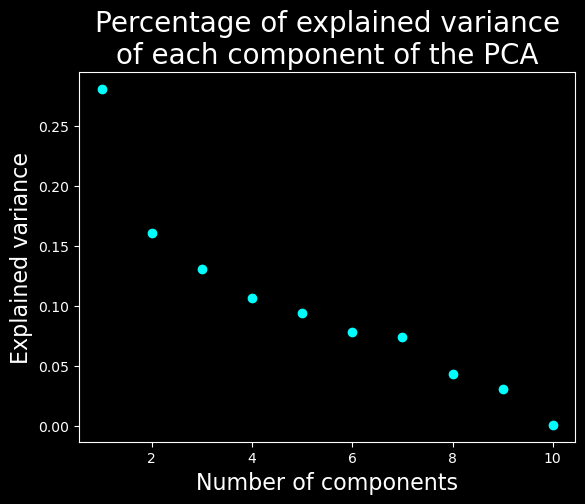

In [6]:
# find the dimensionality of the data
with plt.style.context("dark_background"):
    pca = PCA(n_components=X.shape[1])
    pca.fit(X)
    # plot the explained variance
    plt.scatter(range(1, X.shape[1] + 1), pca.explained_variance_ratio_, c="cyan")
    plt.xlabel("Number of components", fontsize=16)
    plt.ylabel("Explained variance", fontsize=16)
    plt.title("Percentage of explained variance\nof each component of the PCA", fontsize=20)
    plt.show()


We will keep only the 7 first dimensions

## Clustering

### We will run optics on a lower dimension to avoid the curse of the dimensionality 

#### Let's find the latent space using a UMAP

In [7]:
# UMAP
umap = UMAP.UMAP(n_components=7, metric="euclidean")
result_umap_euc = umap.fit_transform(
    X
)

#### Run the clustering in this space using OPTICS or fixed cutoff values with DBSCAN

In [8]:
#code taken from https://scikit-learn.org/stable/auto_examples/cluster/plot_optics.html
clust = OPTICS(min_samples=50, xi=0.05, min_cluster_size=0.05)

# Run the fit
clust.fit(result_umap_euc)

labels_050 = cluster_optics_dbscan(
    reachability=clust.reachability_,
    core_distances=clust.core_distances_,
    ordering=clust.ordering_,
    eps=0.5,
)
labels_200 = cluster_optics_dbscan(
    reachability=clust.reachability_,
    core_distances=clust.core_distances_,
    ordering=clust.ordering_,
    eps=2,
)


#### Visualize the results in the plan defined by the 2 first features and draw a reachability plot

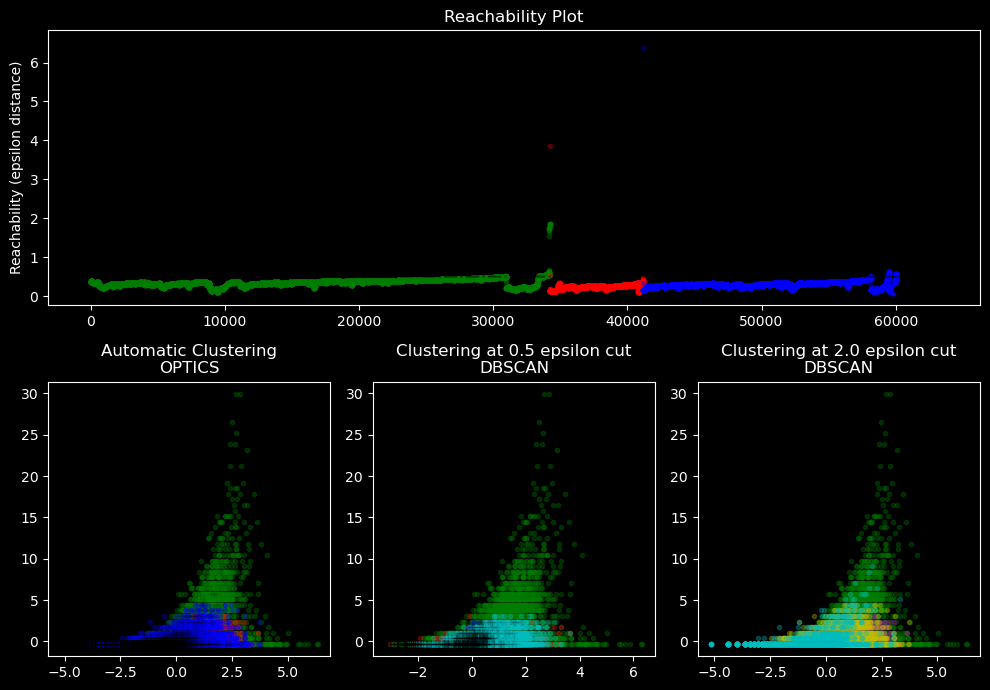

In [9]:
space = np.arange(len(X))
reachability = clust.reachability_[clust.ordering_]
labels = clust.labels_[clust.ordering_]

with plt.style.context("dark_background"):
    plt.figure(figsize=(10, 7))
    G = gridspec.GridSpec(2, 3)
    ax1 = plt.subplot(G[0, :])
    ax2 = plt.subplot(G[1, 0])
    ax3 = plt.subplot(G[1, 1])
    ax4 = plt.subplot(G[1, 2])

    # Reachability plot
    colors = ["g.", "r.", "b.", "y.", "c."]
    for klass, color in zip(range(0, 5), colors):
        Xk = space[labels == klass]
        Rk = reachability[labels == klass]
        ax1.plot(Xk, Rk, color, alpha=0.3)
    ax1.plot(space[labels == -1], reachability[labels == -1], "k.", alpha=0.3)
    ax1.plot(space, np.full_like(space, 2.0, dtype=float), "k-", alpha=0.5)
    ax1.plot(space, np.full_like(space, 0.5, dtype=float), "k-.", alpha=0.5)
    ax1.set_ylabel("Reachability (epsilon distance)")
    ax1.set_title("Reachability Plot")

    # OPTICS
    colors = ["g.", "r.", "b.", "y.", "c."]
    for klass, color in zip(range(0, 5), colors):
        Xk = X[clust.labels_ == klass]
        ax2.plot(Xk[:, 0], Xk[:, 1], color, alpha=0.3)
    ax2.plot(X[clust.labels_ == -1, 0], X[clust.labels_ == -1, 1], "k+", alpha=0.1)
    ax2.set_title("Automatic Clustering\nOPTICS")

    # DBSCAN at 0.5
    colors = ["g.", "r.", "b.", "c."]
    for klass, color in zip(range(0, 4), colors):
        Xk = X[labels_050 == klass]
        ax3.plot(Xk[:, 0], Xk[:, 1], color, alpha=0.3)
    ax3.plot(X[labels_050 == -1, 0], X[labels_050 == -1, 1], "k+", alpha=0.1)
    ax3.set_title("Clustering at 0.5 epsilon cut\nDBSCAN")

    # DBSCAN at 2.
    colors = ["g.", "m.", "y.", "c."]
    for klass, color in zip(range(0, 4), colors):
        Xk = X[labels_200 == klass]
        ax4.plot(Xk[:, 0], Xk[:, 1], color, alpha=0.3)
    ax4.plot(X[labels_200 == -1, 0], X[labels_200 == -1, 1], "k+", alpha=0.1)
    ax4.set_title("Clustering at 2.0 epsilon cut\nDBSCAN")

    plt.tight_layout()
    plt.show()

### Create a UMAP with 3 dimensions for visualization purposes

In [10]:
from umap import umap_ as UMAP
# UMAP
umap = UMAP.UMAP(n_components=3, metric="euclidean")
result_umap_euc = umap.fit_transform(
    X
)

In [11]:
fig = px.scatter_3d(
    result_umap_euc,
    x=0,
    y=1,
    z=2,
    color=clust.labels_.astype(str),
    title="UMAP, showing OPTICS clustering",
    # reduce size points
    size_max=0.1,
    category_orders={"color": [str(i) for i in range(0, len(np.unique(clust.labels_)))]},
)
fig.update_layout({"plot_bgcolor": "#14181e", "paper_bgcolor": "#14181e"})
fig.update_layout(font_color="white")
fig.update_layout(scene=dict(xaxis=dict(showticklabels=False), yaxis=dict(showticklabels=False), zaxis=dict(showticklabels=False)))
fig.update_layout(legend_title_text="Cluster")
fig.update_layout(legend = dict(bgcolor = 'rgba(0,0,0,0)'))
fig.update_layout(scene=dict(xaxis_title="UMAP 1", yaxis_title="UMAP 2", zaxis_title="UMAP 3"))
fig.update_layout(scene = dict(
    xaxis = dict(
            backgroundcolor="rgba(0, 0, 0,0)",
            # gridcolor="rgba(0, 0, 0,0)", # gridcolor is for logo
            showbackground=True,
            zerolinecolor="white",),
    yaxis = dict(
        backgroundcolor="rgba(0, 0, 0,0)",
        # gridcolor="rgba(0, 0, 0,0)",
        showbackground=True,
        zerolinecolor="white"),
    zaxis = dict(
        backgroundcolor="rgba(0, 0, 0,0)",
        # gridcolor="rgba(0, 0, 0,0)",
        showbackground=True,
        zerolinecolor="white",),),
)
display(fig)

By providing a UMAP in 7 dimension to OPTICS we roughly find the communities that we can see by eye in the 3D UMAP

## Visualization of the results

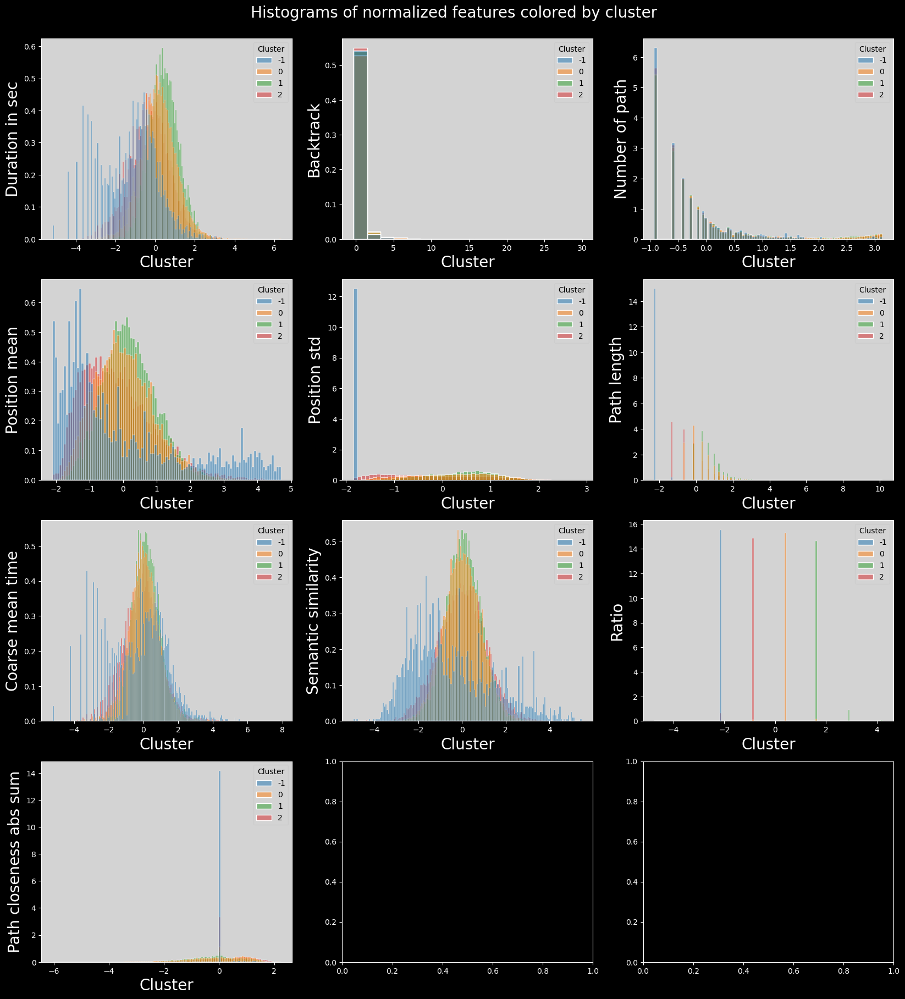

In [12]:
#plot histogram features colored by cluster
with plt.style.context("dark_background"):
    plot_data = combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING].copy().dropna()
    plot_data["cluster"] = clust.labels_
    plot_data["cluster"] = plot_data["cluster"].astype("category")
    n_features = len(plot_data.columns) - 1
    n_cols = 3
    n_rows = int(np.ceil(n_features / n_cols))
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 20))
    axs = axs.flatten()
    for i, col in enumerate(plot_data.columns):
        if col == "cluster":
            continue
        sns.histplot(
            data=plot_data,
            x=col,
            hue="cluster",
            ax=axs[i],
            stat="density",
            common_norm=False,
            palette="tab10",
        )
        utils.set_axis_style(axs, i)

    plt.suptitle("Histograms of normalized features colored by cluster", fontsize=20)
    plt.subplots_adjust(top=0.95)
    plt.show()

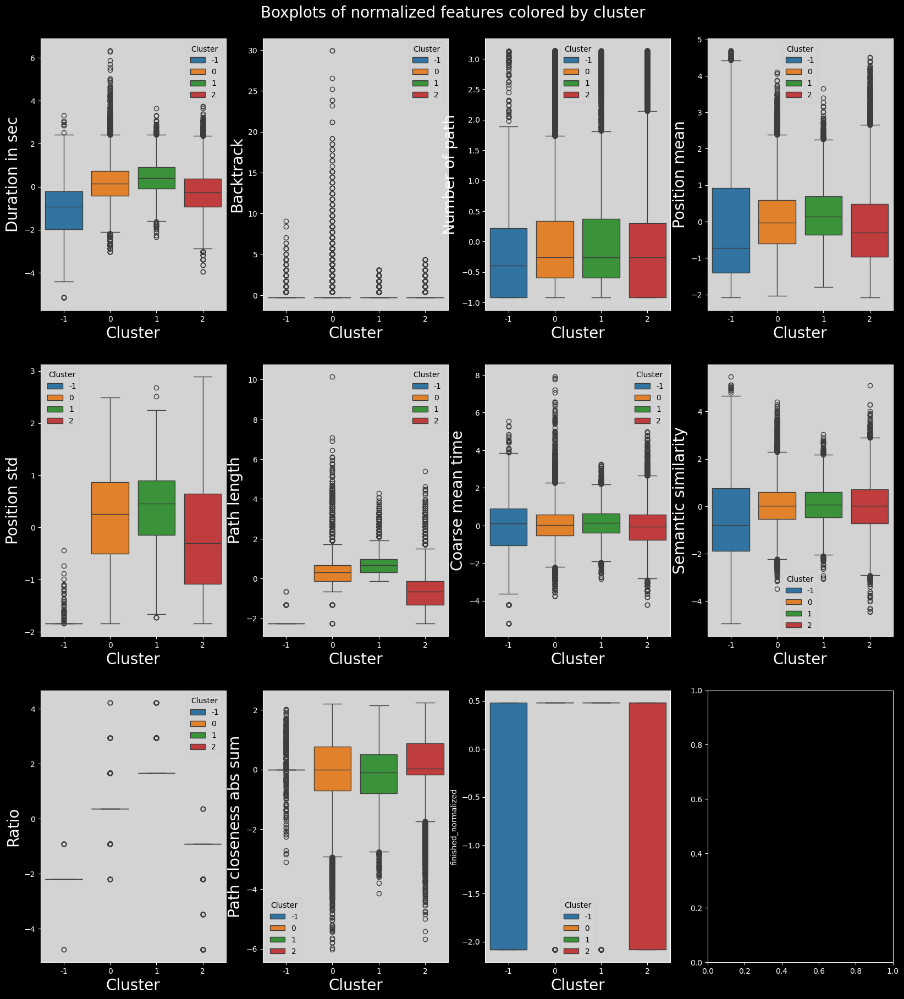

In [13]:
with plt.style.context("dark_background"):
    combined_df = combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING+["finished"]].dropna()
    combined_df["finished_normalized"] = (
        combined_df["finished"] - combined_df["finished"].mean()
    ) / combined_df["finished"].std()
    plot_data = combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING + ["finished_normalized"]].copy()
    plot_data["cluster"] = clust.labels_
    plot_data["cluster"] = plot_data["cluster"].astype("category")
    n_features = len(plot_data.columns) - 1
    n_cols = 4
    n_rows = int(np.ceil(n_features / n_cols))
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 20))
    fig.suptitle("Boxplots of normalized features colored by cluster", fontsize=20)
    plt.subplots_adjust(top=0.95)
    axs = axs.flatten()
    for i, col in enumerate(plot_data.columns):
        if col == "cluster":
            continue
        sns.boxplot(data=plot_data, x="cluster", y=col, ax=axs[i], hue="cluster", palette="tab10")
        utils.set_axis_style(axs, i)
    plt.show()

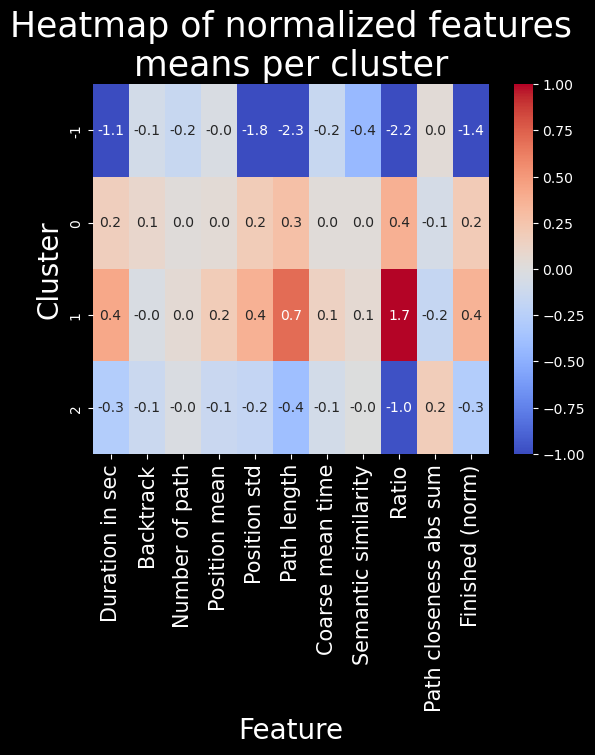

In [14]:
# heatmap of features means per cluster
feat_labels = utils.get_feature_names_labels()
with plt.style.context("dark_background"):
    means = plot_data.groupby(plot_data["cluster"]).mean()
    sns.heatmap(means, cmap="coolwarm", annot=True, fmt=".1f", vmin=-1, vmax=1)
    plt.title("Heatmap of normalized features\nmeans per cluster", fontsize=25)
    plt.ylabel("Cluster", fontsize=20)
    plt.xlabel("Feature", fontsize=20)
    plt.xticks(labels=feat_labels+["Finished (norm)"], ticks=np.arange(len(feat_labels)+1)+0.5, rotation=90, fontsize=15)
    plt.show()

## Discussion and conclusion

Here we can see that the clustering is less interesting. It really makes 4 clusters in which all the features used to do the clustering are either very low, low, high or very high.